### Practical Homework 3: Birds sound classification using Deep Learning Neural Network
#### by Prateek Pagare

This project explores the development of neural network models to classify bird sounds from the Seattle area, Using Binary Model, Multi-class Model and External Test Data using spectrograms generated from audio recordings.

#### Libraries

In [1]:
# Load necessary libraries 
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
np.complex = complex
import librosa
import librosa.display
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam, RMSprop
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, ConfusionMatrixDisplay, mean_absolute_error
from tensorflow.image import resize
from skimage.transform import resize
import h5py

#### Load dataset
We start by loading the preprocessed bird voice spectrogram dataset . The dataset contains 12 bird species  representing the frequency patterns of bird voice.

In [3]:
with h5py.File('bird_spectrograms.hdf5', 'r') as file:
    species_names = list(file.keys())
    print("Available Species:", species_names)
    for bird in species_names:
        print(f"{bird} shape: {file[bird].shape}")

Available Species: ['amecro', 'amerob', 'bewwre', 'bkcchi', 'daejun', 'houfin', 'houspa', 'norfli', 'rewbla', 'sonspa', 'spotow', 'whcspa']
amecro shape: (128, 517, 66)
amerob shape: (128, 517, 172)
bewwre shape: (128, 517, 144)
bkcchi shape: (128, 517, 45)
daejun shape: (128, 517, 125)
houfin shape: (128, 517, 84)
houspa shape: (128, 517, 630)
norfli shape: (128, 517, 37)
rewbla shape: (128, 517, 187)
sonspa shape: (128, 517, 263)
spotow shape: (128, 517, 137)
whcspa shape: (128, 517, 91)


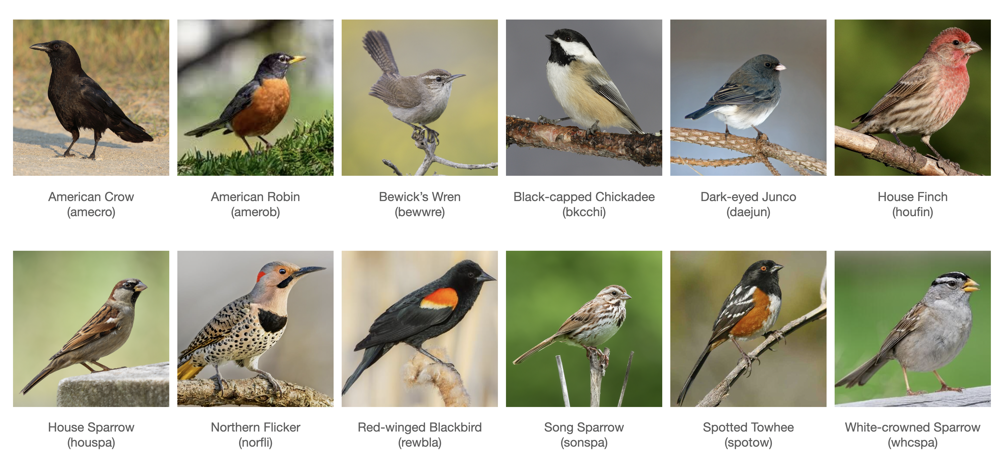

#### Preprocess Bird (Spectrogram) Dataset

In [5]:
spectrogram_data = []
label_data = []
with h5py.File('bird_spectrograms.hdf5', 'r') as file:
    for label_index, bird_name in enumerate(species_names):
        bird_spectrograms = np.array(file[bird_name])
        for i in range(bird_spectrograms.shape[2]):
            single_spec = bird_spectrograms[:, :, i]
            spectrogram_data.append(single_spec)
            label_data.append(label_index)
X_all_birds = np.array(spectrogram_data).reshape(-1, 128, 517, 1)
y_all_birds = np.array(label_data)
print("shape of data:", X_all_birds.shape)
print("shape of label:", y_all_birds.shape)

shape of data: (1981, 128, 517, 1)
shape of label: (1981,)


##### Each Bird Spectrogram Plots

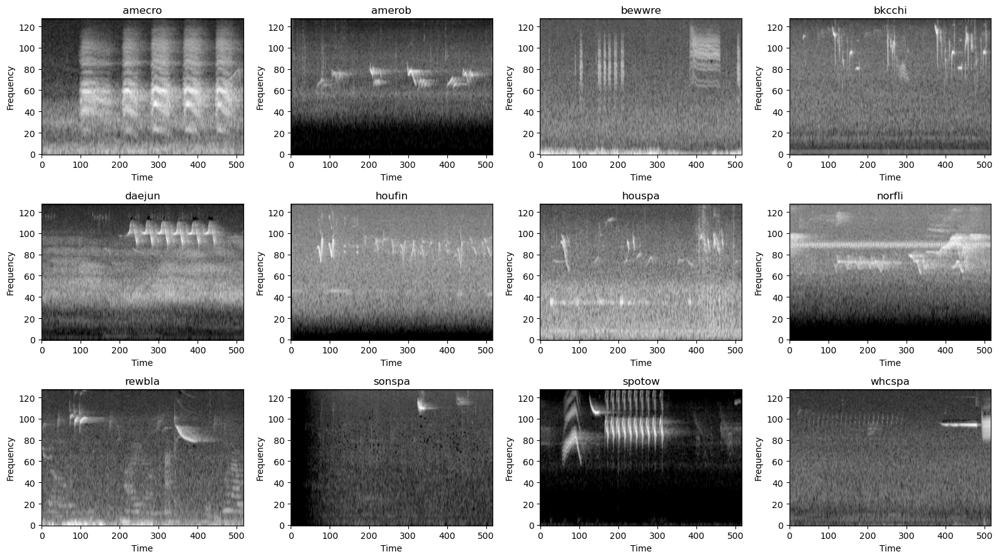

In [7]:
fig, axes = plt.subplots(3, 4, figsize=(16, 9))
axes = axes.flatten()

for i, bird in enumerate(species_names):
    sample_index = np.where(y_all_birds == i)[0][0]  # first sample of species
    axes[i].imshow(X_all_birds[sample_index, :, :, 0], aspect='auto', cmap='gray', origin='lower')
    axes[i].set_title(bird)
    axes[i].set_xlabel("Time")
    axes[i].set_ylabel("Frequency")
plt.tight_layout()
plt.show()

Each bird species shows unique visual patterns in their spectrograms.

##### Check the distribution like how many samples per species 

In [9]:
species_labels, species_counts = np.unique(y_all_birds, return_counts=True)
for name, count in zip(species_names, species_counts):
    print(f"{name}: {count} samples")

amecro: 66 samples
amerob: 172 samples
bewwre: 144 samples
bkcchi: 45 samples
daejun: 125 samples
houfin: 84 samples
houspa: 630 samples
norfli: 37 samples
rewbla: 187 samples
sonspa: 263 samples
spotow: 137 samples
whcspa: 91 samples


he number of sound clips varies for each bird species. Some, like House Sparrow (houspa), have many recordings (630), while others like Northern Flicker (norfli) have very few (only 37).

## 1.) Binary Model
I decided to choose **American Crow (amecro)** and **Spotted Towhee (spotow)** for this binary model

prepare dataset for binary and doing Test - Train Split.

In [23]:
# amecro data for American Crow and spotow for Spotted Towhee 
crow_index = species_names.index('amecro')  
sparrow_index = species_names.index('spotow') 

# Now Let's label the selected species
# Using 0 for American Crow birds and 1 for Spotted Towhee birds and combine data , lables
selected_mask = np.isin(y_all_birds, [crow_index, sparrow_index])
X_binary_data = X_all_birds[selected_mask]
y_binary_labels = y_all_birds[selected_mask]
y_binary_labels = np.where(y_binary_labels == crow_index, 0, 1)
y_binary_onehot = to_categorical(y_binary_labels, num_classes=2)

In [25]:
#Train-Test Split the data with 80% training set and 20% validation sets
X_train_bin, X_val_bin, y_train_bin, y_val_bin = train_test_split(X_binary_data, y_binary_onehot, test_size=0.2, stratify=y_binary_labels, random_state=42)
print(X_train_bin.shape, X_val_bin.shape, y_train_bin.shape, y_val_bin.shape)

(162, 128, 517, 1) (41, 128, 517, 1) (162, 2) (41, 2)


In [27]:
# Defining the CNN model for our Binary classification 
binary_cnn_model = Sequential([
    Conv2D(32, kernel_size=(3,3), activation='relu', input_shape=(128, 517, 1)),
    MaxPooling2D(pool_size=(2,2)),
     Dropout(0.2),
    Conv2D(64, kernel_size=(3,3), activation='relu'),
    MaxPooling2D(pool_size=(2,2)),
    Flatten(),
    Dense(64, activation='relu'),
    Dropout(0.5),
    Dense(2, activation='sigmoid')])

C:\Users\PRATEEK\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [29]:
# Model Summary
binary_cnn_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 126, 515, 32)        │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 63, 257, 32)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 63, 257, 32)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 61, 255, 64)         │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 30, 127, 64)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 243840)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 64)                  │      15,605,824 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 2)                   │             130 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,624,770 (59.60 MB)

 Trainable params: 15,624,770 (59.60 MB)

 Non-trainable params: 0 (0.00 B)

In [31]:
# Compiling the model
binary_cnn_model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])

In [33]:
#Train the model on the training data 
history_binary = binary_cnn_model.fit(X_train_bin, y_train_bin,epochs=20, batch_size=16,validation_data=(X_val_bin, y_val_bin))

Epoch 1/20
11/11 ━━━━━━━━━━━━━━━━━━━━ 18s 2s/step - accuracy: 0.5224 - loss: 262.5760 - val_accuracy: 0.6829 - val_loss: 1.8640
Epoch 2/20
11/11 ━━━━━━━━━━━━━━━━━━━━ 8s 753ms/step - accuracy: 0.6197 - loss: 3.8700 - val_accuracy: 0.3902 - val_loss: 0.6931
Epoch 3/20
11/11 ━━━━━━━━━━━━━━━━━━━━ 9s 781ms/step - accuracy: 0.6212 - loss: 0.6751 - val_accuracy: 0.7317 - val_loss: 0.6921
Epoch 4/20
11/11 ━━━━━━━━━━━━━━━━━━━━ 9s 796ms/step - accuracy: 0.6255 - loss: 0.6680 - val_accuracy: 0.7073 - val_loss: 0.6912
Epoch 5/20
11/11 ━━━━━━━━━━━━━━━━━━━━ 8s 759ms/step - accuracy: 0.6838 - loss: 0.6352 - val_accuracy: 0.6829 - val_loss: 0.6900
Epoch 6/20
11/11 ━━━━━━━━━━━━━━━━━━━━ 8s 747ms/step - accuracy: 0.6857 - loss: 0.6408 - val_accuracy: 0.6829 - val_loss: 0.6909
Epoch 7/20
11/11 ━━━━━━━━━━━━━━━━━━━━ 9s 819ms/step - accuracy: 0.6847 - loss: 0.6805 - val_accuracy: 0.6829 - val_loss: 0.6851
Epoch 8/20
11/11 ━━━━━━━━━━━━━━━━━━━━ 9s 767ms/step - accuracy: 0.6390 - loss: 0.7139 - val_accuracy: 0.

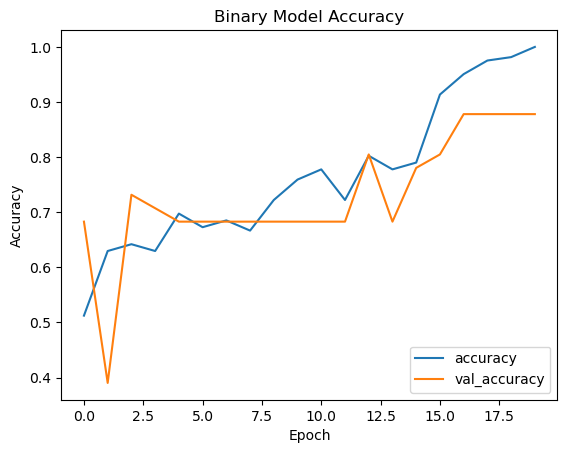

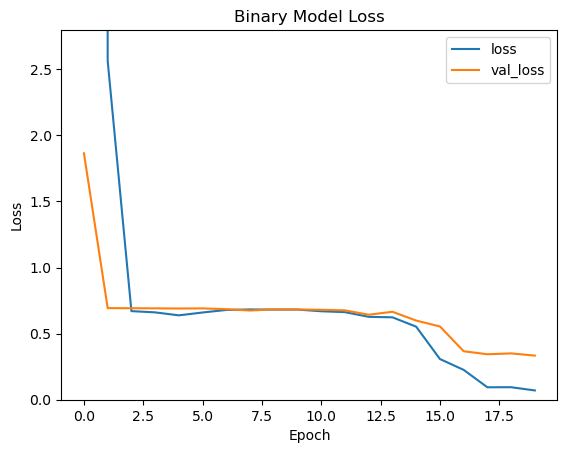

In [35]:
# Model accuracy Plot
plt.plot(history_binary.history['accuracy'])
plt.plot(history_binary.history['val_accuracy'])
plt.title('Binary Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['accuracy', 'val_accuracy'], loc='lower right')
plt.show()

# Model Loss Plot
plt.plot(history_binary.history['loss'])
plt.plot(history_binary.history['val_loss'])
plt.title('Binary Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['loss', 'val_loss'], loc='upper right')
plt.ylim(0, max(history_binary.history['val_loss']) * 1.5)
plt.show()

In [37]:
# Evaluating the model on the validation set
eval_loss, eval_acc = binary_cnn_model.evaluate(X_val_bin, y_val_bin)
print(f"Validation Accuracy: {eval_acc:.4f}")
print(f"Validation Loss: {eval_loss:.4f}")

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - accuracy: 0.8666 - loss: 0.3550
Validation Accuracy: 0.8780
Validation Loss: 0.3338


In [38]:
y_true_bin = np.argmax(y_val_bin, axis=1)
#predict new data
y_pred_prob_bin = binary_cnn_model.predict(X_val_bin)
y_pred_bin = np.argmax(y_pred_prob_bin, axis=1)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


In [41]:
# Show precision, recall, and F1-score for each class
print("Classification Report:")
print(classification_report(y_true_bin, y_pred_bin, target_names=['amecro', 'spotow']))

Classification Report:
              precision    recall  f1-score   support

      amecro       1.00      0.62      0.76        13
      spotow       0.85      1.00      0.92        28

    accuracy                           0.88        41
   macro avg       0.92      0.81      0.84        41
weighted avg       0.90      0.88      0.87        41



In [43]:
mae_score = mean_absolute_error(y_true_bin, y_pred_bin)
print(f"Mean Absolute Error: {mae_score:.4f}")

Mean Absolute Error: 0.1220


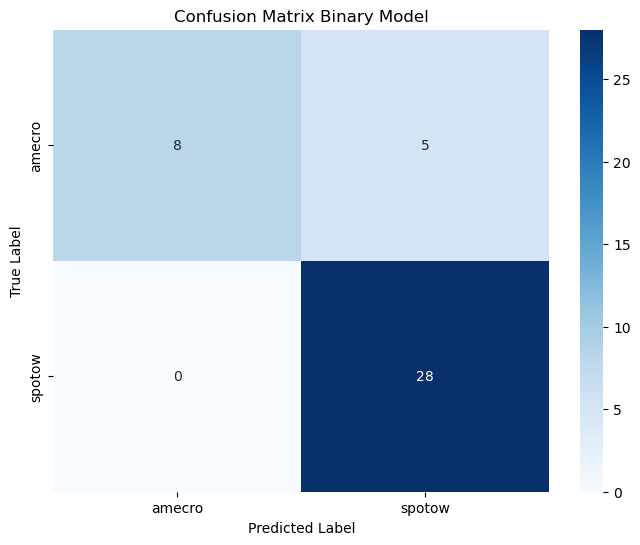

In [45]:
# Confusion Matrix
cm = confusion_matrix(y_true_bin, y_pred_bin)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=['amecro', 'spotow'], yticklabels=['amecro', 'spotow'])
plt.title('Confusion Matrix Binary Model')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

## 2.) Multi-class Model between all 12 bird species

In [11]:
#Convert bird labels into one-hot encoded format
y_all_cat = to_categorical(y_all_birds, num_classes=len(species_names))

# Train-Test Split
X_train_m, X_test_m, y_train_m, y_test_m = train_test_split(X_all_birds, y_all_cat, test_size=0.2, stratify=y_all_birds, random_state=42)
print("Train shape:", X_train_m.shape)
print("Test shape:", X_test_m.shape)

Train shape: (1584, 128, 517, 1)
Test shape: (397, 128, 517, 1)


In [13]:
# Compute class weights for each class to handle class imbalance
# Store the weights in a dictionary format to use during model training
y_train_labels = np.argmax(y_train_m, axis=1)
class_weights_array = compute_class_weight('balanced', classes=np.unique(y_train_labels), y=y_train_labels)
class_weights_dict = dict(enumerate(class_weights_array))

In [15]:
# CNN Model for Multi-class Classification 
# on dense layer with taking dropout and uses softmax activationto predict in final layer 
model_m = Sequential([
    Conv2D(32, (3,3), activation='relu', input_shape=(128, 517, 1)),
    MaxPooling2D((2,2)),
    Conv2D(64, (3,3), activation='relu'),
    MaxPooling2D((2,2)),
    Flatten(),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(len(species_names), activation='softmax')
])

C:\Users\PRATEEK\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [16]:
model_m.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 126, 515, 32)        │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 63, 257, 32)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 61, 255, 64)         │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 30, 127, 64)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 243840)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │      62,423,296 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 12)                  │           3,084 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 62,445,196 (238.21 MB)

 Trainable params: 62,445,196 (238.21 MB)

 Non-trainable params: 0 (0.00 B)

In [19]:
# Compile the model using RMSprop optimizer
model_m.compile(optimizer=RMSprop(learning_rate=0.001),loss='categorical_crossentropy',metrics=['accuracy'])

In [21]:
# Train the model
history_m = model_m.fit(X_train_m, y_train_m,epochs=20,batch_size=64,validation_data=(X_test_m, y_test_m),class_weight=class_weights_dict)

Epoch 1/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 120s 4s/step - accuracy: 0.1133 - loss: 708.8934 - val_accuracy: 0.2771 - val_loss: 2.3470
Epoch 2/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 77s 3s/step - accuracy: 0.1982 - loss: 5.7188 - val_accuracy: 0.2292 - val_loss: 2.1617
Epoch 3/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 75s 3s/step - accuracy: 0.4587 - loss: 1.6940 - val_accuracy: 0.3577 - val_loss: 2.1054
Epoch 4/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 74s 3s/step - accuracy: 0.4379 - loss: 12.4723 - val_accuracy: 0.3426 - val_loss: 3.2174
Epoch 5/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 77s 3s/step - accuracy: 0.4630 - loss: 6.0450 - val_accuracy: 0.2846 - val_loss: 2.5568
Epoch 6/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 79s 3s/step - accuracy: 0.7913 - loss: 0.6365 - val_accuracy: 0.3753 - val_loss: 3.0664
Epoch 7/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 95s 4s/step - accuracy: 0.4187 - loss: 43.5288 - val_accuracy: 0.3526 - val_loss: 7.4714
Epoch 8/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 100s 4s/step - accuracy: 0.7037 - loss: 1.5271 - val_accuracy: 0.3602 - val

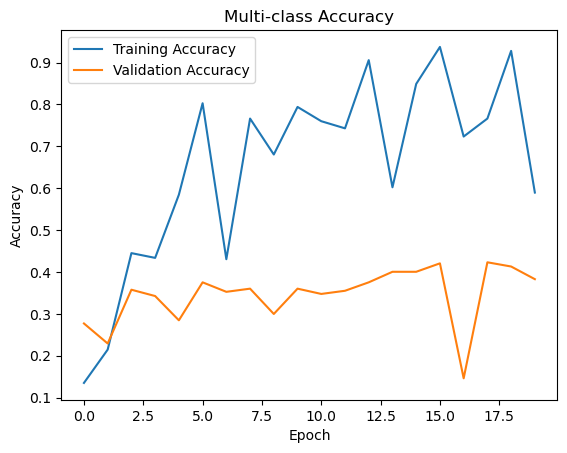

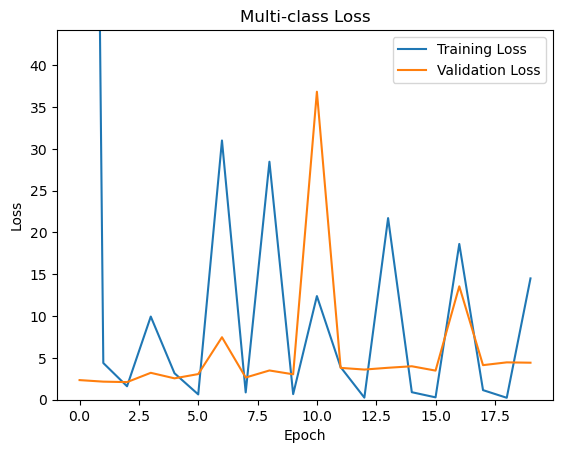

In [46]:

plt.plot(history_m.history['accuracy'], label='Training Accuracy')
plt.plot(history_m.history['val_accuracy'], label='Validation Accuracy')
plt.title('Multi-class Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()
# Model Loss Plot
plt.plot(history_m.history['loss'], label='Training Loss')
plt.plot(history_m.history['val_loss'], label='Validation Loss')
plt.title('Multi-class Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.ylim(0, max(history_m.history['val_loss']) * 1.2)
plt.legend()

plt.show()

In [25]:
# Evaluating the model on the validation set
y_pred_prob_m = model_m.predict(X_test_m)
y_pred_m = np.argmax(y_pred_prob_m, axis=1)
y_true_m = np.argmax(y_test_m, axis=1)

13/13 ━━━━━━━━━━━━━━━━━━━━ 5s 367ms/step


In [26]:
# Result
val_acc = history_m.history['val_accuracy'][-1]
val_loss = history_m.history['val_loss'][-1]
print(f"Validation Accuracy: {val_acc:.4f}")
print(f"Validation Loss: {val_loss:.4f}")

Validation Accuracy: 0.3829
Validation Loss: 4.4265


In [29]:
# Classification Report for multi-class model
report = classification_report(y_true_m, y_pred_m, target_names=species_names, output_dict=True)
report_df = pd.DataFrame(report).transpose()
print("Classification Report:")
print(report_df)

Classification Report:
              precision    recall  f1-score     support
amecro         0.500000  0.461538  0.480000   13.000000
amerob         0.772727  0.485714  0.596491   35.000000
bewwre         0.062500  0.068966  0.065574   29.000000
bkcchi         1.000000  0.111111  0.200000    9.000000
daejun         0.333333  0.400000  0.363636   25.000000
houfin         0.294118  0.294118  0.294118   17.000000
houspa         0.520548  0.603175  0.558824  126.000000
norfli         0.000000  0.000000  0.000000    7.000000
rewbla         0.161290  0.131579  0.144928   38.000000
sonspa         0.272727  0.339623  0.302521   53.000000
spotow         0.384615  0.370370  0.377358   27.000000
whcspa         0.142857  0.111111  0.125000   18.000000
accuracy       0.382872  0.382872  0.382872    0.382872
macro avg      0.370393  0.281442  0.292371  397.000000
weighted avg   0.395012  0.382872  0.376073  397.000000


C:\Users\PRATEEK\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\PRATEEK\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\PRATEEK\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


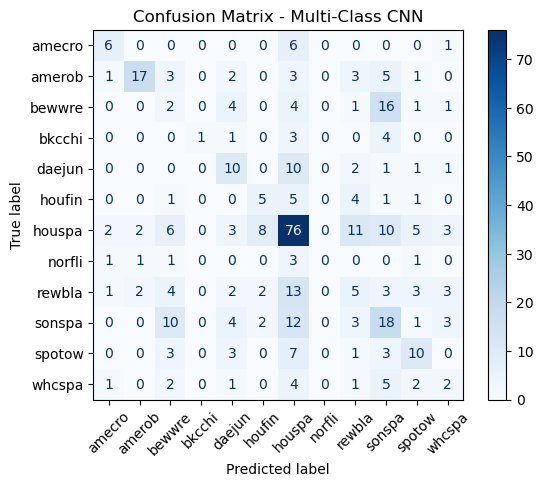

In [31]:
# Confusion Matrix for multi-class model
cm = confusion_matrix(y_true_m, y_pred_m)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=species_names)
disp.plot(xticks_rotation=45, cmap='Blues')
plt.title("Confusion Matrix - Multi-Class CNN")
plt.show()

## 3.) External Test Data on all 12 species

In [34]:
# # Directory containing the test clips
clip_paths = ['test_clips/test1.mp3', 'test_clips/test2.mp3', 'test_clips/test3.mp3']
species_labels = species_names  # previously defined list of 12 species

# Model input size as CNN model
img_height = 128
img_width = 517

# Function to preprocess the test audio files and generate spectrograms for the same
def extract_spectrograms(path):
    y, sr = librosa.load(path, sr=22050)
    segment_len = sr * 2 # split into 2-second chunks
    segments = [y[i:i + segment_len] for i in range(0, len(y) - segment_len + 1, segment_len)]
    processed = []
    for seg in segments:
        mel = librosa.feature.melspectrogram(y=seg, sr=sr, n_mels=128)
        mel_db = librosa.power_to_db(mel, ref=np.max)
        mel_scaled = (mel_db - mel_db.min()) / (mel_db.max() - mel_db.min())
        mel_resized = resize(mel_scaled, [img_height, img_width], mode='constant')
        processed.append(mel_resized)
    return np.array(processed)[..., np.newaxis], librosa.get_duration(y=y, sr=sr)

In [40]:
# Make predictions for each clip
# Load the trained model
model = model_m
summary_table = []

# Processing each test file and storing the results
for i, path in enumerate(clip_paths):
    spectrograms, duration = extract_spectrograms(path)
    predictions = model.predict(spectrograms)
    mean_scores = np.mean(predictions, axis=0)
    top_3 = mean_scores.argsort()[-3:][::-1]
    
# check if more than one bird is present or not 
    has_overlap = 'Yes' if np.sum(mean_scores[top_3] > 0.1544) >= 2 else 'No'

 # store the result   
    summary_table.append({
        'Audio File': f"Clip {i+1}",
        'First': species_labels[top_3[0]],
        'Score ': f"{mean_scores[top_3[0]]*100:.1f}%",
        'Second': species_labels[top_3[1]],
        'Score': f"{mean_scores[top_3[1]]*100:.1f}%",
        'Third': species_labels[top_3[2]],
        'Score 3': f"{mean_scores[top_3[2]]*100:.1f}%",
        'More that one species': has_overlap,
        'audio length sec': round(duration, 2)})

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


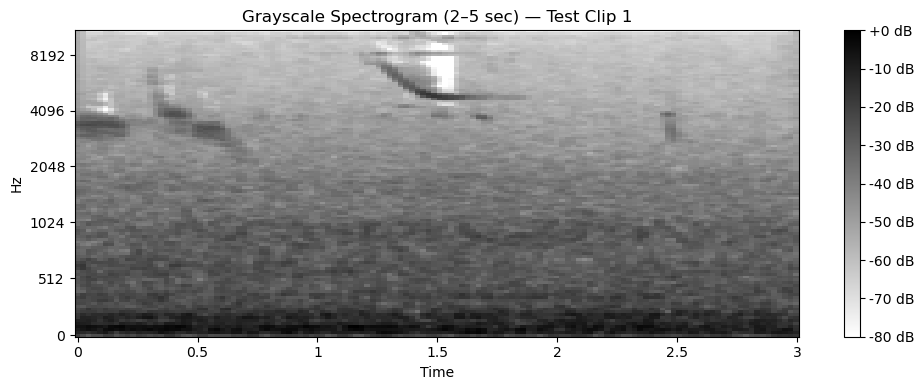

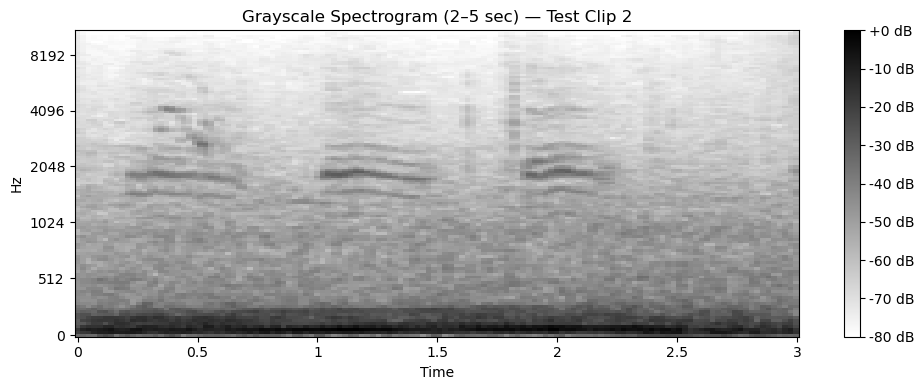

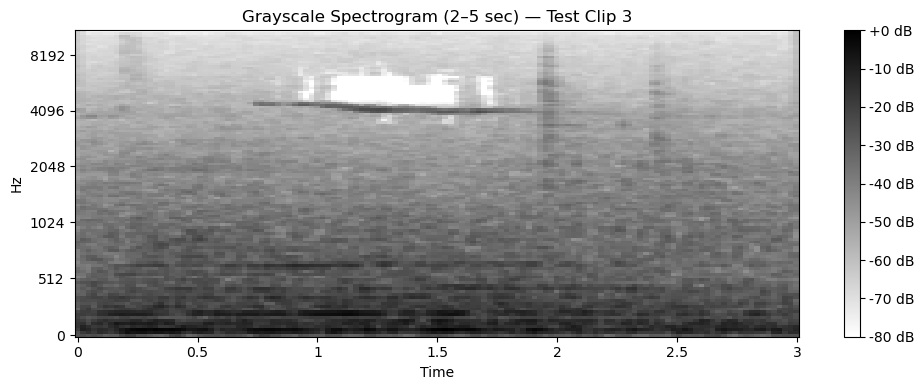

| Audio File   | First   | Score    | Second   | Score   | Third   | Score 3   | More that one species   |   audio length sec |
|:-------------|:--------|:---------|:---------|:--------|:--------|:----------|:------------------------|-------------------:|
| Clip 1       | norfli  | 19.4%    | amecro   | 15.8%   | houspa  | 12.5%     | Yes                     |              11.93 |
| Clip 2       | amecro  | 19.4%    | norfli   | 15.4%   | sonspa  | 12.8%     | No                      |               5.25 |
| Clip 3       | norfli  | 21.3%    | amecro   | 15.5%   | houspa  | 12.8%     | Yes                     |              11.74 |


In [42]:
# Plot spectrograms 
for i, path in enumerate(clip_paths):
    y, sr = librosa.load(path, sr=22050)
    y_section = y[2*sr:5*sr]
    mel = librosa.feature.melspectrogram(y=y_section, sr=sr, n_mels=128)
    mel_db = librosa.power_to_db(mel, ref=np.max)

    plt.figure(figsize=(10, 4))
    librosa.display.specshow(mel_db, sr=sr, x_axis='time', y_axis='mel', cmap='gray_r')
    plt.colorbar(format='%+2.0f dB')
    plt.title(f"Grayscale Spectrogram (2–5 sec) — Test Clip {i+1}")
    plt.tight_layout()
    plt.show()

# Displaying results in a table
results_df = pd.DataFrame(summary_table)
print(results_df.to_markdown(index=False))

## Reference 

+ ISLP Book : https://hastie.su.domains/ISLP/ISLP_website.pdf.download.html
+ Librosa convert audio to spectrogram : https://khareanu1612.medium.com/audio-signal-processing-with-spectrograms-and-librosa-b66a0a6bc5cc
+ Librosa : https://librosa.org/doc/main/tutorial.html and https://librosa.org/doc/latest/index.html
+ Tensorflow , Keras: https://www.tensorflow.org/tutorials/images/cnn and https://www.tensorflow.org/learn
+ Audio spectrogram classification : https://github.com/jeffprosise/Deep-Learning/blob/master/Audio%20Classification%20(CNN).ipynb
+ Confusion matrix visuals : https://medium.com/@dtuk81/confusion-matrix-visualization-fc31e3f30fea
+ adam optimizer : https://www.tensorflow.org/api_docs/python/tf/keras/optimizers/Adam
+ class weights for imbalance datasets : https://www.tensorflow.org/tutorials/structured_data/imbalanced_data
+ In class Labs Ch10-1-keras.ipynb, Ch10-2-keras.ipynb and Class PPT.